*Authors - Edwin Adrian, Devika S.Nair, Geethanjali Dhanish, Sooryajith M.Y., Sumedha Chawla*

This code basically implements a Convolutional Neural Network (CNN) using transferlearning with the ResNet50 architecture for image classification.We are using Tensorflow framewrod for this purpose. We are using a subset of the Food 101 dataset, where the different images of food are classifies into 101 classes. We will be only building the model for a few classes of food due to computational and storage expenses.The dataset is taken from kaggle.

## IMPORTING NECESSARY LIBRARIES

In [1]:
import tensorflow as tf
import matplotlib.image as img
%matplotlib inline
import numpy as np
from collections import defaultdict
import collections
from shutil import copy
from shutil import copytree, rmtree
import tensorflow.keras.backend as K
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt
import numpy as np
import os
import random
import tensorflow as tf
import tensorflow.keras.backend as K
from tensorflow.keras import regularizers
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten
from tensorflow.keras.layers import Convolution2D, MaxPooling2D, ZeroPadding2D, GlobalAveragePooling2D, AveragePooling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, CSVLogger
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.regularizers import l2
from tensorflow import keras
from tensorflow.keras import models


In [12]:
# Check if GPU is enabled
print(tf.__version__)
print(tf.test.gpu_device_name())

2.16.1



## EXTRACTING DATASET

In [2]:
def get_data_extract(data_dir):
    if "food_data" in os.listdir(data_dir):
        print("Dataset already exists")


# Provide the path to your dataset directory
data_dir = r"C:\Users\hp\Desktop\FOOD\food_data"

# Call the function to download and extract your dataset
get_data_extract(data_dir)

# Check the contents of your dataset directory
print(os.listdir(data_dir))

['apple_pie', 'baby_back_ribs', 'baklava', 'beef_carpaccio', 'beef_tartare', 'beet_salad', 'beignets', 'bibimbap', 'bread_pudding', 'breakfast_burrito', 'bruschetta', 'caesar_salad', 'cannoli', 'caprese_salad', 'carrot_cake', 'ceviche', 'cheesecake', 'cheese_plate', 'chicken_curry', 'chicken_quesadilla', 'chicken_wings', 'chocolate_cake', 'chocolate_mousse', 'churros', 'clam_chowder', 'club_sandwich', 'crab_cakes', 'creme_brulee', 'croque_madame', 'cup_cakes', 'deviled_eggs', 'donuts', 'dumplings', 'edamame', 'eggs_benedict', 'escargots', 'falafel', 'filet_mignon', 'fish_and_chips', 'foie_gras', 'french_fries', 'french_onion_soup', 'french_toast', 'fried_calamari', 'fried_rice', 'frozen_yogurt', 'garlic_bread', 'gnocchi', 'greek_salad', 'grilled_cheese_sandwich', 'grilled_salmon', 'guacamole', 'gyoza', 'hamburger', 'hot_and_sour_soup', 'hot_dog', 'huevos_rancheros', 'hummus', 'ice_cream', 'lasagna', 'lobster_bisque', 'lobster_roll_sandwich', 'macaroni_and_cheese', 'macarons', 'miso_sou

## VISUALISING RANDOM IMAGE FROM EACH CLASSES

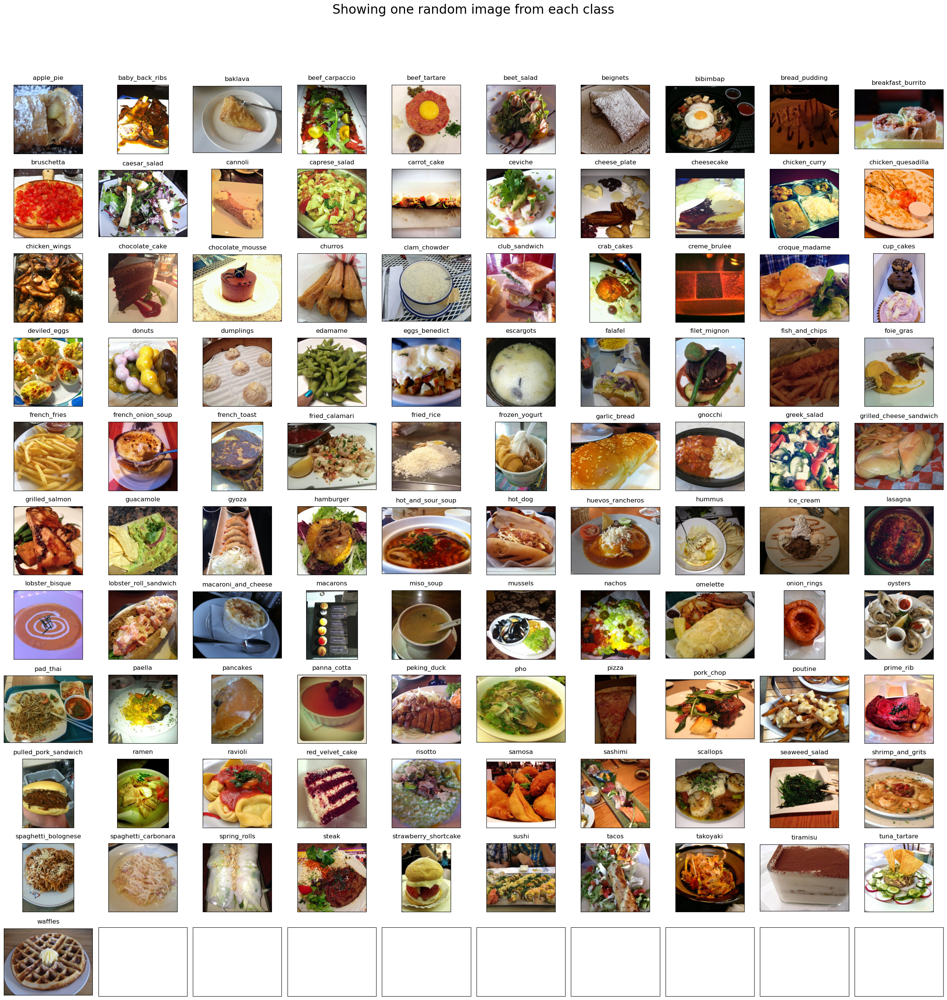

In [36]:
import os
import numpy as np
import matplotlib.pyplot as plt

# Set the number of rows and columns for the subplot grid
rows = 11
cols = 10

# Create a subplot grid
fig, ax = plt.subplots(rows, cols, figsize=(25, 25))
fig.suptitle("Showing one random image from each class", y=1.05, fontsize=24)

# Define the directory where your dataset is located
data_dir = r"C:\Users\hp\Desktop\FOOD\food_data"

# Get the list of food classes (folders) in your dataset
foods_sorted = sorted(os.listdir(data_dir))

# Initialize a variable to keep track of the current food class
food_id = 0

# Iterate over the subplot grid
for i in range(rows):
    for j in range(cols):
        try:
            # Get the name of the current food class
            food_selected = foods_sorted[food_id]
            food_id += 1
        except:
            break
        
        # Skip any system files (like .DS_Store on macOS)
        if food_selected.startswith('.'):
            continue
        
        # Get the list of images in the current food class
        food_selected_images = os.listdir(os.path.join(data_dir, food_selected))
        
        # Choose a random image from the current food class
        food_selected_random = np.random.choice(food_selected_images)
        
        # Load and display the image
        img = plt.imread(os.path.join(data_dir, food_selected, food_selected_random))
        ax[i][j].imshow(img)
        ax[i][j].set_title(food_selected, pad=10)

# Remove the axis ticks
plt.setp(ax, xticks=[], yticks=[])

# Adjust the layout to prevent overlapping titles
plt.tight_layout()

# Show the plot
plt.show()


## DATA SPLITTING INTO TEST AND TRAIN

In [5]:
import os
from shutil import copy
import random
from sklearn.model_selection import train_test_split

# List all the classes (folders) in your dataset
classes = os.listdir(data_dir)

# Create train and test directories if they don't exist
train_dir = 'train'
test_dir = 'test'
os.makedirs(train_dir, exist_ok=True)
os.makedirs(test_dir, exist_ok=True)

# Iterate over each class and split its images into train and test sets
for cls in classes:
    cls_dir = os.path.join(data_dir, cls)
    if os.path.isdir(cls_dir):
        # List all the images in the class directory
        images = [img for img in os.listdir(cls_dir) if img.endswith('.jpg')]
        # Split the images into train and test sets
        train_images, test_images = train_test_split(images, test_size=0.2, random_state=42)
        # Copy train images to train directory
        for img in train_images:
            src = os.path.join(cls_dir, img)
            dest = os.path.join(train_dir, cls, img)
            os.makedirs(os.path.dirname(dest), exist_ok=True)
            copy(src, dest)
        # Copy test images to test directory
        for img in test_images:
            src = os.path.join(cls_dir, img)
            dest = os.path.join(test_dir, cls, img)
            os.makedirs(os.path.dirname(dest), exist_ok=True)
            copy(src, dest)

print("Dataset split into train and test sets successfully!")


Dataset split into train and test sets successfully!


In [6]:
import os

# Function to count the number of files in a directory
def count_files(directory):
    count = 0
    for root, dirs, files in os.walk(directory):
        count += len(files)
    return count

# Define the paths to the train and test folders
train_folder = 'train'
test_folder = 'test'

# Count the number of files in the train folder
num_train_files = count_files(train_folder)

# Count the number of files in the test folder
num_test_files = count_files(test_folder)

# Print the total number of samples in both train and test folders
print("Total number of samples in train folder:", num_train_files)
print("Total number of samples in test folder:", num_test_files)


Total number of samples in train folder: 16160
Total number of samples in test folder: 4040


## CREATE A SUBSET OF THE DATA WITH FEW CLASSES 

In [7]:
foods_sorted

['apple_pie',
 'baby_back_ribs',
 'baklava',
 'beef_carpaccio',
 'beef_tartare',
 'beet_salad',
 'beignets',
 'bibimbap',
 'bread_pudding',
 'breakfast_burrito',
 'bruschetta',
 'caesar_salad',
 'cannoli',
 'caprese_salad',
 'carrot_cake',
 'ceviche',
 'cheese_plate',
 'cheesecake',
 'chicken_curry',
 'chicken_quesadilla',
 'chicken_wings',
 'chocolate_cake',
 'chocolate_mousse',
 'churros',
 'clam_chowder',
 'club_sandwich',
 'crab_cakes',
 'creme_brulee',
 'croque_madame',
 'cup_cakes',
 'deviled_eggs',
 'donuts',
 'dumplings',
 'edamame',
 'eggs_benedict',
 'escargots',
 'falafel',
 'filet_mignon',
 'fish_and_chips',
 'foie_gras',
 'french_fries',
 'french_onion_soup',
 'french_toast',
 'fried_calamari',
 'fried_rice',
 'frozen_yogurt',
 'garlic_bread',
 'gnocchi',
 'greek_salad',
 'grilled_cheese_sandwich',
 'grilled_salmon',
 'guacamole',
 'gyoza',
 'hamburger',
 'hot_and_sour_soup',
 'hot_dog',
 'huevos_rancheros',
 'hummus',
 'ice_cream',
 'lasagna',
 'lobster_bisque',
 'lobster

In [8]:
from shutil import rmtree, copytree

# Define the function to create mini train and test datasets
def dataset_mini(food_list, src, dest):
    # Remove destination directory if it already exists
    if os.path.exists(dest):
        rmtree(dest)
    
    # Create destination directory
    os.makedirs(dest)
    
    # Copy images for selected food items from source to destination
    for food_item in food_list:
        print("Copying images into", food_item)
        copytree(os.path.join(src, food_item), os.path.join(dest, food_item))

# Define the list of selected food classes
food_list = ['apple_pie','pizza','omelette']

# Define source and destination paths for mini train dataset
src_train = 'train'
dest_train = r"C:\Users\hp\Desktop\FOOD\mini_train"

# Define source and destination paths for mini test dataset
src_test = 'test'
dest_test = r"C:\Users\hp\Desktop\FOOD\mini_test"

print("Creating train data folder with new classes")
dataset_mini(food_list, src_train, dest_train)
print("Creating test data folder with new classes")
dataset_mini(food_list, src_test, dest_test)

Creating train data folder with new classes
Copying images into apple_pie
Copying images into pizza
Copying images into omelette
Creating test data folder with new classes
Copying images into apple_pie
Copying images into pizza
Copying images into omelette


In [9]:
print("Total number of samples in train folder:",count_files('mini_train'))
print("Total number of samples in test folder:",count_files('mini_test'))

Total number of samples in train folder: 480
Total number of samples in test folder: 120


## BUILDING THE MODEL

In [11]:
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.callbacks import ModelCheckpoint, CSVLogger
from tensorflow.keras import regularizers
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.resnet50 import ResNet50

K.clear_session()
n_classes = 3
img_width, img_height = 224, 224
train_data_dir = r"C:\Users\hp\Desktop\FOOD\mini_train"
validation_data_dir = r"C:\Users\hp\Desktop\FOOD\mini_test"
nb_train_samples = 480 
nb_validation_samples = 120 
batch_size = 32

train_datagen = ImageDataGenerator(
    rescale=1. / 255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True)

test_datagen = ImageDataGenerator(rescale=1. / 255)

train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical')

validation_generator = test_datagen.flow_from_directory(
    validation_data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical')


resnet50 = ResNet50(weights='imagenet', include_top=False)
x = resnet50.output
x = GlobalAveragePooling2D()(x)
x = Dense(128,activation='relu')(x)
x = Dropout(0.2)(x)

predictions = Dense(3,kernel_regularizer=regularizers.l2(0.005), activation='softmax')(x)

model = Model(inputs=resnet50.input, outputs=predictions)
model.compile(optimizer=SGD(learning_rate=0.0001, momentum=0.9), loss='categorical_crossentropy', metrics=['accuracy'])

checkpointer = ModelCheckpoint(filepath=r"C:\Users\hp\Desktop\FOOD\best_model_3class.keras", verbose=1, save_best_only=True)
csv_logger = CSVLogger(r"C:\Users\hp\Desktop\FOOD\history_3class.log")

history = model.fit(train_generator,
                    steps_per_epoch = nb_train_samples // batch_size,
                    validation_data=validation_generator,
                    validation_steps=nb_validation_samples // batch_size,
                    epochs=10,
                    verbose=1,
                    callbacks=[csv_logger, checkpointer])

model.save(r"C:\Users\hp\Desktop\FOOD\model_trained_3class.hdf5")

Found 480 images belonging to 3 classes.
Found 120 images belonging to 3 classes.
Epoch 1/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.3429 - loss: 1.3160
Epoch 1: val_loss improved from inf to 1.13128, saving model to C:\Users\hp\Desktop\FOOD\best_model_3class.keras
15/15 ━━━━━━━━━━━━━━━━━━━━ 95s 5s/step - accuracy: 0.3440 - loss: 1.3130 - val_accuracy: 0.3438 - val_loss: 1.1313
Epoch 2/10


C:\Users\hp\anaconda3\Lib\contextlib.py:155: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)



Epoch 2: val_loss did not improve from 1.13128
15/15 ━━━━━━━━━━━━━━━━━━━━ 4s 286ms/step - accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_accuracy: 0.2500 - val_loss: 1.1594
Epoch 3/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.3834 - loss: 1.2498
Epoch 3: val_loss improved from 1.13128 to 1.12892, saving model to C:\Users\hp\Desktop\FOOD\best_model_3class.keras
15/15 ━━━━━━━━━━━━━━━━━━━━ 79s 5s/step - accuracy: 0.3849 - loss: 1.2458 - val_accuracy: 0.3125 - val_loss: 1.1289
Epoch 4/10

Epoch 4: val_loss improved from 1.12892 to 1.12249, saving model to C:\Users\hp\Desktop\FOOD\best_model_3class.keras
15/15 ━━━━━━━━━━━━━━━━━━━━ 3s 198ms/step - accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_accuracy: 0.3750 - val_loss: 1.1225
Epoch 5/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.4671 - loss: 1.0886
Epoch 5: val_loss did not improve from 1.12249
15/15 ━━━━━━━━━━━━━━━━━━━━ 77s 5s/step - accuracy: 0.4677 - loss: 1.0874 - val_accuracy: 0.3750 - val_loss: 1.1431
Epoch 6/10

E

In [12]:
class_map_3 = train_generator.class_indices
class_map_3

{'apple_pie': 0, 'omelette': 1, 'pizza': 2}

In [15]:
def plot_accuracy(history,title):
    plt.title(title)
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_acc'])
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train_accuracy', 'validation_accuracy'], loc='best')
    plt.show()
def plot_loss(history,title):
    plt.title(title)
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train_loss', 'validation_loss'], loc='best')
    plt.show()

## FITTING THE BEST MODEL

In [18]:
%%time
# Loading the best saved model to make predictions
K.clear_session()
model_best = load_model(r"C:\Users\hp\Desktop\FOOD\best_model_3class.keras",compile = False)

CPU times: total: 4.89 s
Wall time: 4.69 s


In [19]:
def predict_class(model, images, show = True):
  for img in images:
    img = image.load_img(img, target_size=(224, 224))
    img = image.img_to_array(img)                    
    img = np.expand_dims(img, axis=0)         
    img /= 255.                                      

    pred = model.predict(img)
    index = np.argmax(pred)
    food_list.sort()
    pred_value = food_list[index]
    if show:
        plt.imshow(img[0])                           
        plt.axis('off')
        plt.title(pred_value)
        plt.show()

## TESTING THE MODEL

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step


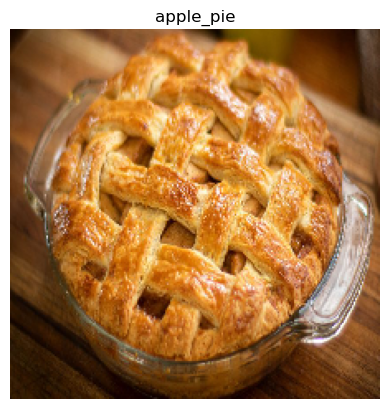

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step


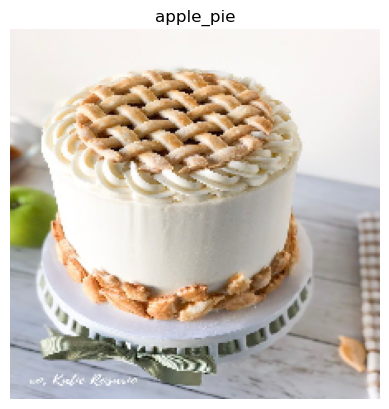

In [35]:
images = []
images.append('applepie1.jpg')
images.append('cake.jpg')
predict_class(model_best, images, True)